# `xarrayvideo` for the DeepExtremeCubes dataset

Notebook setup

In [1]:
#Autoreload .py files
%load_ext autoreload
%autoreload 2

#https://github.com/chmp/ipytest/issues/80
import sys
sys.breakpointhook = sys.__breakpointhook__

Load required libraries

In [2]:
import xarray as xr
import numpy as np
from pathlib import Path
from xarrayvideo import xarray2video, video2xarray, gap_fill, plot_image, to_netcdf
import matplotlib.pyplot as plt

/home/oscar/.conda/envs/xv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Load the example minicube (first unzip `cube.zip`)

In [335]:
array_id= '-111.49_38.60'
input_path= '../mc_-111.49_38.60_1.2.2_20230702_0.zarr'
output_path= './out'
use_B07= True

minicube= xr.open_dataset(input_path, engine='zarr')
minicube['SCL']= minicube['SCL'].astype(np.uint8) #Fixes problem with the dataset
minicube['cloudmask_en']= minicube['cloudmask_en'].astype(np.uint8)
if not use_B07: minicube= minicube.drop_vars('B07') #We drop a variable for now

minicube

<xarray.Dataset> Size: 471MB
Dimensions:       (time: 495, y: 128, x: 128, event_time: 2192, y_300: 9,
                   x_300: 9)
Coordinates:
  * event_time    (event_time) datetime64[ns] 18kB 2016-01-01 ... 2021-12-31
  * time          (time) datetime64[ns] 4kB 2016-01-03T12:00:00 ... 2022-10-0...
  * x             (x) float64 1kB 9.787e+05 9.787e+05 ... 9.812e+05 9.812e+05
  * x_300         (x_300) float64 72B 9.785e+05 9.788e+05 ... 9.809e+05
  * y             (y) float64 1kB 4.288e+06 4.288e+06 ... 4.285e+06 4.285e+06
  * y_300         (y_300) float64 72B 4.288e+06 4.287e+06 ... 4.285e+06
Data variables: (12/38)
    B02           (time, y, x) float64 65MB ...
    B03           (time, y, x) float64 65MB ...
    B04           (time, y, x) float64 65MB ...
    B05           (time, y, x) float64 65MB ...
    B06           (time, y, x) float64 65MB ...
    B07           (time, y, x) float64 65MB ...
    ...            ...
    t2m_max       (time) float32 2kB ...
    t2m_mean      (time) float32 2kB ...
    t2m_min       (time) float32 2kB ...
    tp_max        (time) float32 2kB ...
    tp_mean       (time) float32 2kB ...
    tp_min        (time) float32 2kB ...
Attributes: (12/27)
    Conventions:               CF-1.7
    base_minicube:             deepextremes-minicubes/1.1.p/mc_-111.49_38.60_...
    base_version:              1.1.p
    changes:                   https://github.com/bcdev/deepextremes/minicube...
    creation_date:             2023-06-18 01:58:08
    data_id:                   mc_-111.49_38.60_1.2.2_20230702_0
    ...                        ...
    time_coverage_resolution:  P5DT0H0M0S
    time_coverage_start:       2016-01-01T00:00:00+00:00
    time_period:               5D
    time_range:                ['2016-01-01', '2022-10-10']
    title:                     Minicube at -111.49 38.60
    version:                   1.2.2

## Inter-frame registration

We want to fix the small jitter betweeen timesteps to improve compression and downstream task performance.

This is however not working fully consistently as of now, so it is disabled.

In [336]:
assert False, 'Comment out this line to run intra-frame registration'
    
import satalign, satalign.ecc, satalign.pcc #satalign.lgm
import cv2

def get_masked_mean_reference(minicube, bands, mask_name='cloudmask_en'):
    data = minicube[bands].isel(time=slice(74, None)).to_array().transpose('variable', 'time', 'y', 'x')
    mask = minicube[mask_name].isel(time=slice(74, None)).transpose('time', 'y', 'x')
    data_np, mask_np= np.array(data), np.array(mask)
    data_np[:, mask_np > 0] = np.nan
    data_np = np.nanmean(data_np, axis=1)
    return data_np, mask_np

#Reload minicube for testing
minicube= xr.open_dataset(input_path, engine='zarr')
minicube['SCL']= minicube['SCL'].astype(np.uint8) #Fixes problem with the dataset
if not use_B07: minicube= minicube.drop_vars('B07') #We drop a variable for now

bands= ['B04','B03','B02','B8A','B06','B05'] + (['B07'] if use_B07 else [])
reference_image, mask= get_masked_mean_reference(minicube, bands=bands, mask_name='cloudmask_en')
# reference_image= minicube[bands].isel(time=slice(74,None)).mean("time").to_array().transpose('variable', 'y', 'x')
datacube= minicube[bands].to_array().transpose('time', 'variable', 'y', 'x')

syncmodel= satalign.pcc.PCC( #PCC quicker, ECC more precise
    interpolation= cv2.INTER_CUBIC,
    datacube=datacube, # T x C x H x W
    reference=reference_image, # C x H x W
    datacube_mask=mask,
    channel="mean", crop_center=96, num_threads=1)
new_cube, warps, errors, error_before, error_after= syncmodel.run_multicore()

#Plot scatter plot
warp_df = satalign.utils.warp2df(warps, datacube.time.values)
satalign.utils.plot_s2_scatter(warp_df)

#Copy back
minicube_aligned= minicube.copy()
for b in bands: minicube_aligned[b]= new_cube.sel(variable=b)

satalign.utils.plot_profile(
    warped_cube=new_cube.values,
    raw_cube=datacube.values,
    x_axis=3,
    rgb_band=[0,1,2],
    intensity_factor=1.,
    figsize= (7,10)
    )
plt.show()
print(f'{error_before=:.6f}, {error_after=:.6f}, improvement={error_before-error_after:.6f}')

AssertionError: Comment out this line to run intra-frame registration

## Gap-fill clouds

Another thing that can improve compression is to fill in the cloud pixels with some interpolated reflectances.

For now, however, we won't be gap-filling of the clouds, since it is too big of a change to the data.

In [337]:
assert False, 'Comment out this line to run a simple gap filling'    

#Perform the gap filling. Three methods: last_value, interp_forward, interp (non-causal!!)
minicube_filled= gap_fill(minicube, fill_bands=bands, mask_band='cloudmask_en',
                          fill_values=[1, 3, 4], method='last_value', new_mask='invalid', 
                          coord_names=('time', 'variable', 'y', 'x'))

#RGB orig
plot_image(minicube, ['B04','B03','B02'], mask_name='cloudmask_en', save_name='./out/RGB original.jpg')

#RGB gap-filled
plot_image(minicube_filled, ['B04','B03','B02'], mask_name='invalid', save_name='./out/RGB gap-filled.jpg')

AssertionError: Comment out this line to run a simple gap filling

## Some useful `ffmpeg` commands

Since we are basically using `ffmpeg` for the enconding, here are some important commands

In [346]:
# To see supported codecs
!ffmpeg -codecs | grep DEV.

ffmpeg version 5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_plac --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnu

In [347]:
# Get info of a particular encoder
!ffmpeg -h encoder=libx265 -v quiet #vp9, libx264, libx265, ffv1

Encoder libx265 [libx265 H.265 / HEVC]:
    General capabilities: dr1 delay threads 
    Threading capabilities: other
    Supported pixel formats: yuv420p yuvj420p yuv422p yuvj422p yuv444p yuvj444p gbrp yuv420p10le yuv422p10le yuv444p10le gbrp10le yuv420p12le yuv422p12le yuv444p12le gbrp12le gray gray10le gray12le
libx265 AVOptions:
  -crf               <float>      E..V....... set the x265 crf (from -1 to FLT_MAX) (default -1)
  -qp                <int>        E..V....... set the x265 qp (from -1 to INT_MAX) (default -1)
  -forced-idr        <boolean>    E..V....... if forcing keyframes, force them as IDR frames (default false)
  -preset            <string>     E..V....... set the x265 preset
  -tune              <string>     E..V....... set the x265 tune parameter
  -profile           <string>     E..V....... set the x265 profile
  -udu_sei           <boolean>    E..V....... Use user data unregistered SEI if available (default false)
  -x265-params       <dictionary> E..V....... set

## Compress the minicube using `xarray2video`

If you get `ContainsGroupError` when running the commands below, make sure to delete the existing `out` folder:

In [348]:
# Remove out folder to avoid errors
!rm -rf ./out

### Conversion rules

See example below for an example
```
{
 'video_name_1': ( 
    var or (var1, var2, var3), #Variables present in the xarray
    (t_coord_name, x_coord_name, y_coord_name), #Names of the coordinates in order (t, x, y)
    [Optional] n_components: 0 or n_components 
        - 0: store all bands in sets of 3 channels, last video might only have 1 or 2 channels (less efficient)
        - n_components: store all bands using n_components, which must be divisable by 3
    [Optional] compression parameters dictionary:  
       {
        'c:v': 'libx265',  #[libx264, libx265, vp9, ffv1]
        'preset': 'medium',  #Preset for quality/encoding speed tradeoff: quick, medium, slow (better)
        'crf': 3, #3 default, the lower, the higher the quality
        'x265-params': 'qpmin=0:qpmax=5:psy-rd=0:psy-rdoq=0' #qpmax controls the quality when crf is 0
       },
    [Optional] number of bits (e.g.: 8,10,12,16),
    ),
 'video_name_2': etc
}
```

In [349]:
#Save original minicube for comparing the size (it will be compressed)
# array_id= '-111.49_38.60'
Path(output_path).mkdir(exist_ok=True, parents=True)
#minicube.to_zarr(Path(output_path) / f'{array_id}.zarr')
to_netcdf(minicube_algined, Path(output_path) / f'{array_id}.nc')

In [174]:
#Define the output video encoding parameters.

#Video lossless
#Best for lossless: ffv1
lossless_params= { 'c:v':'ffv1' }
#Best for lossless 3-channel: vp9
# lossless_params= {'c:v':'vp9', 'lossless':1, 'deadline':'good'} #good, best, realtime

#Video lossy 
#Best for lossy 3-channel: libx265, 12 bits
#Psychovisual Rate-Distortion Optimization (Psy-RD) is a technique used in video encoding 
#that adjusts the bit allocation and quantization to improve the perceived visual quality 
#of the encoded video. This method takes into account the human visual system's sensitivity 
#to different types of distortions and allocates more bits to areas that are more noticeable 
#to the human eye, such as edges and textures, while compressing other areas more aggressively
# -> We disable those optimizations!
lossy_params= {
    'c:v': 'libx265',  #[libx264, libx265, vp9, ffv1] #Test: -c:v jpegxl output_%04d.jxl
    'preset': 'medium',  #Preset for quality/encoding speed tradeoff: quick, medium, slow (better)
    'crf': [1], #14 default, 11 for higher quality and size
    # 'tune': 'ssim', #ssim, psnr
    # 'x265-params': 'no-sao:selective-sao=0',
    'x265-params': ['qpmin=0:qpmax=0.1:psy-rd=0:psy-rdoq=0', #:lookahead-frames=25
                    'qpmin=0:qpmax=1:psy-rd=0:psy-rdoq=0',   #When using a low qpmax, basically crf is 100% ignored
                    'qpmin=0:qpmax=10:psy-rd=0:psy-rdoq=0'], #Usually with crf=0 this is around 4-8, sot set higher to go <0
    # "lookahead-slices=1"
    #psy-rd=0:psy-rdoq=0
    }
# lossy_params= {
#     'c:v': 'vp9',
#     'crf': 3,
#     'arnr-strength': 2,
#     # 'qmin': 0,
#     # 'qmax': 3,
#     'lag-in-frames': 25,
#     'arnr-maxframes': 7,
#     }

#Image lossy / lossless
image_lossy_params= {
    'codec': 'JP2OpenJPEG',
    'QUALITY': '25', #100 for lossless, less than that for lossy
    # 'REVERSIBLE': 'YES',  #YES for lossless
    'YCBCR420':'NO',
    'WRITE_METADATA': 'NO'
    }

image_lossless_params= {
    'codec': 'JP2OpenJPEG',
    'QUALITY': '100', #100 for lossless, less than that for lossy
    'REVERSIBLE': 'YES',  #YES for lossless
    'YCBCR420':'NO',
    'WRITE_METADATA': 'NO'
    }

#Define conversion rules for the different bands
#We can manually choose how to compress the different bands
#There are also automatic modes for encoding many bands at once
conversion_rules= {
    #Sets of 3 channels are the most efficient for lossy compression
    'rgb': ( ('B04','B03','B02'), ('time','x','y'), 0, lossy_params, 12), #[0, 0.4]), 
    'ir3': ( ('B8A','B06','B05'), ('time','x','y'), 0, lossy_params, 12), #[0, 0.4]), # if [0, 0.4]: normalize values to that range
    
    #Compressing 1 channel lossy is not efficient, as it just repeats the channel 3 times
    # 'r': ( 'B04', ('time','x','y'), 0, lossy_params, 12),
    
    #We can do PCA and keep a subset of principal components (e.g. 6)
    # 'all': ( ('B07', 'B06','B05', 'B04','B03','B02','B8A'), ('time','x','y'), 6, lossy_params, 12),
    
    # We can pass all the bands, NOT do PCA, and repeat any bands if needed so that they are divisible by 3
    # 'all2': ( ('B07','B06','B05','B04','B03','B02','B8A'), ('time','x','y'), 0, lossy_params, 12),
    
    #We can store all channels in a single image, but using a different image for every timestep
    # 'all3': ( ('B07','B06','B05','B04','B03','B02','B8A'), ('time','x','y'), 0, image_lossy_params, 16),
    
    # Compressing losslessly is efficient
    'scl': ( 'SCL', ('time','x','y'), 0, lossless_params, 8),
    'cm': ( 'cloudmask_en', ('time','x','y'), 0, lossless_params, 8),
    }

ffmpeg version 5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_plac --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnu

rgb: 185.62Mb -> ['6.42']Mb (showing last 10)(3.46% of original size, 2.2126 bpppb) in 12.96s
 - params={'c:v': 'libx265', 'preset': 'medium', 'crf': [1], 'x265-params': ['qpmin=0:qpmax=0.1:psy-rd=0:psy-rdoq=0', 'qpmin=0:qpmax=1:psy-rd=0:psy-rdoq=0', 'qpmin=0:qpmax=10:psy-rd=0:psy-rdoq=0']}
 - Decompression time 0.37s


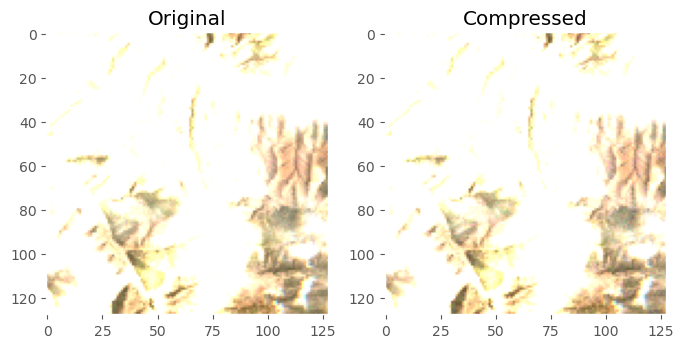

Saturation values per band ('B04', 'B03', 'B02')):
 [[0.  0.4]
 [0.  0.4]
 [0.  0.4]]
 - SSIM_sat 0.875255
 - MSE_sat 0.044746
 - PSNR_sat 18.3795
 - Exp. SA 0.0133 
Metrics took 1.68s to run


ffmpeg version 5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_plac --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnu

scl: 7.73Mb -> ['0.50']Mb (showing last 10)(6.48% of original size, 0.5185 bpppb) in 0.35s
 - params={'c:v': 'ffv1'}
 - Decompression time 0.13s


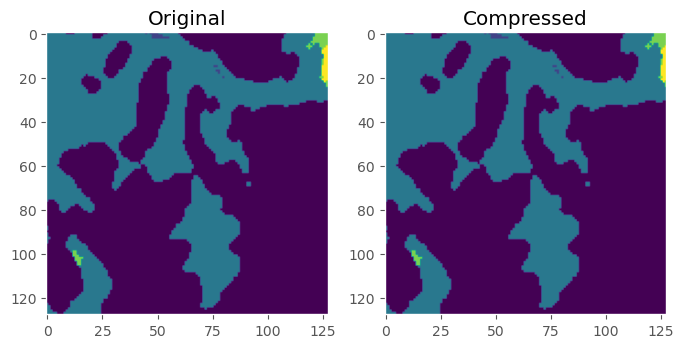

 - acc 1.00


In [175]:
#Run with compute_stats (takes a bit longer)
arr_dict= xarray2video(minicube, array_id, conversion_rules, fmt='auto',
                       output_path=output_path, compute_stats=True,
                       loglevel='verbose', #verbose, quiet
                       save_dataset= True
                       )  

### Check the metadata inside the video file

In [350]:
!ffprobe -v error -show_format -show_streams out/-111.49_38.60/all2_001.mkv

out/-111.49_38.60/all2_001.mkv: No such file or directory


### Check the actual size of the final files

Compute total size, and observe a signficant compression factor (~25x)

In [18]:
original_path= str(Path(output_path) / f'{array_id}.nc')
!du -h {original_path} -d0

254M	out/-111.49_38.60.nc


In [19]:
new_path= str(Path(output_path) / f'{array_id}')
!du -h {new_path} 

9,0M	out/-111.49_38.60


## Read the saved videos with `video2xarray`

Read again the written file, and check that everything has persisted

In [28]:
minicube_new= video2xarray(output_path, 'array_id', transpose=True) 
minicube_new

<xarray.Dataset> Size: 244MB
Dimensions:       (y: 128, x: 128, time: 495, event_time: 2192, y_300: 9,
                   x_300: 9)
Coordinates:
  * event_time    (event_time) datetime64[ns] 18kB 2016-01-01 ... 2021-12-31
  * time          (time) datetime64[ns] 4kB 2016-01-03T12:00:00 ... 2022-10-0...
  * x             (x) float64 1kB 9.787e+05 9.787e+05 ... 9.812e+05 9.812e+05
  * x_300         (x_300) float64 72B 9.785e+05 9.788e+05 ... 9.809e+05
  * y             (y) float64 1kB 4.288e+06 4.288e+06 ... 4.285e+06 4.285e+06
  * y_300         (y_300) float64 72B 4.288e+06 4.287e+06 ... 4.285e+06
Data variables: (12/38)
    cop_dem       (y, x) float64 131kB ...
    crs_300       int64 8B ...
    e_max         (time) float32 2kB ...
    e_mean        (time) float32 2kB ...
    e_min         (time) float32 2kB ...
    event_labels  (event_time) uint16 4kB ...
    ...            ...
    B04           (time, x, y) float32 32MB 0.0 0.0 0.0 ... 0.1035 0.1035 0.1051
    B03           (time, x, y) float32 32MB 0.0 0.0 0.0 ... 0.08157 0.08314
    B02           (time, x, y) float32 32MB 0.0 0.0 0.0 ... 0.06118 0.06588
    B8A           (time, x, y) float32 32MB 0.0 0.0 0.0 ... 0.167 0.1654 0.1642
    SCL           (time, x, y) uint8 8MB 0 0 0 0 0 0 0 0 0 ... 5 5 5 5 5 5 5 5 5
    cloudmask_en  (time, x, y) uint8 8MB 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
Attributes: (12/27)
    Conventions:               CF-1.7
    base_minicube:             deepextremes-minicubes/1.1.p/mc_-111.49_38.60_...
    base_version:              1.1.p
    changes:                   https://github.com/bcdev/deepextremes/minicube...
    creation_date:             2023-06-18 01:58:08
    data_id:                   mc_-111.49_38.60_1.2.2_20230702_0
    ...                        ...
    time_coverage_resolution:  P5DT0H0M0S
    time_coverage_start:       2016-01-01T00:00:00+00:00
    time_period:               5D
    time_range:                ['2016-01-01', '2022-10-10']
    title:                     Minicube at -111.49 38.60
    version:                   1.2.2

## Visualize results

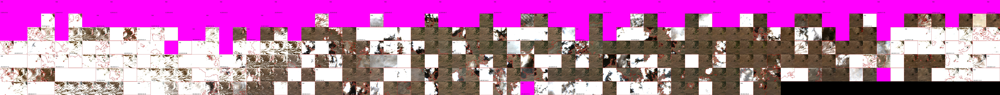

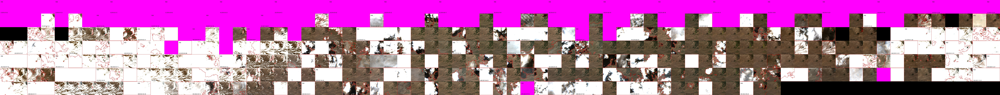

In [29]:
#RGB
plot_image(minicube, ['B04','B03','B02'], save_name='./out/RGB original.jpg')
plot_image(minicube_new, ['B04','B03','B02'], save_name='./out/RGB compressed.jpg')

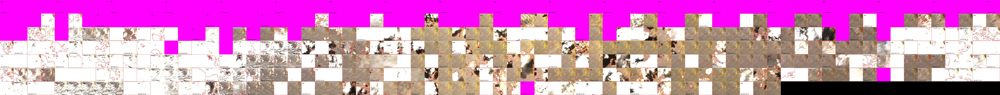

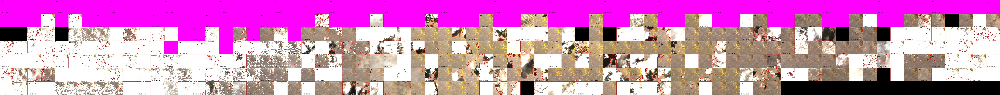

In [30]:
#R3
plot_image(minicube, ['B8A','B06','B05'], save_name='./out/R3 original.jpg')
plot_image(minicube_new, ['B8A','B06','B05'], save_name='./out/R3 compressed.jpg')

Watch as a video. Note that most video codecs are not supported for visualization (h264 is, for instance)

In [351]:
from IPython.display import Video, display, HTML, Image
for video in conversion_rules.keys():
    path= Path(output_path) / array_id / f'{video}.mkv'
    display(HTML(f'<h4>{video}</h4>{path}'))
    display(Video(path, width=512, height=512, embed=True))

## Test the video-dataset of `DeepExtremeCubes`

This part of the notebooks assumes that you have download the full DeepExtremeCubes dataset, as well as its video version.

We will load a cube from both original and compressed and compare both.

In [352]:
dx_in_path= Path('/scratch/users/databases/deepextremes/deepextremes-minicubes/full')
dx_video_path= Path('/scratch/users/databases/deepextremes-video')
cube_paths= np.array(list(dx_in_path.glob('*/*.zarr'))) #'*/*.zarr'
cube_path= cube_paths[12]

dx= xr.open_dataset(cube_path, engine='zarr')
dx

<xarray.Dataset> Size: 552MB
Dimensions:       (time: 495, y: 128, x: 128, event_time: 2192, y_300: 9,
                   x_300: 9)
Coordinates:
  * event_time    (event_time) datetime64[ns] 18kB 2016-01-01 ... 2021-12-31
  * time          (time) datetime64[ns] 4kB 2016-01-03T12:00:00 ... 2022-10-0...
  * x             (x) float64 1kB 5.673e+05 5.673e+05 ... 5.698e+05 5.698e+05
  * x_300         (x_300) float64 72B 5.671e+05 5.674e+05 ... 5.695e+05
  * y             (y) float64 1kB 8.956e+06 8.956e+06 ... 8.953e+06 8.953e+06
  * y_300         (y_300) float64 72B 8.956e+06 8.955e+06 ... 8.953e+06
Data variables: (12/37)
    B02           (time, y, x) float64 65MB ...
    B03           (time, y, x) float64 65MB ...
    B04           (time, y, x) float64 65MB ...
    B05           (time, y, x) float64 65MB ...
    B06           (time, y, x) float64 65MB ...
    B07           (time, y, x) float64 65MB ...
    ...            ...
    t2m_max       (time) float32 2kB ...
    t2m_mean      (time) float32 2kB ...
    t2m_min       (time) float32 2kB ...
    tp_max        (time) float32 2kB ...
    tp_mean       (time) float32 2kB ...
    tp_min        (time) float32 2kB ...
Attributes: (12/17)
    changes:        https://github.com/bcdev/deepextremes/minicube-generation...
    creation_date:  2023-06-05 21:51:36
    data_id:        mc_-71.22_80.63_1.1_20230605_0
    description:    The minicube covering the area around -71.22 and 80.63
    license:        Terms and conditions of the DeepESDL data distribution
    location_id:    -71.22_80.63
    ...             ...
    spatial_res:    20
    spatial_size:   [128, 128]
    time_period:    5D
    time_range:     ['2016-01-01', '2022-10-10']
    title:          Minicube at -71.22 80.63
    version:        1.1

In [ ]:
dx_new= video2xarray(dx_video_path, '_'.join(cube_path.name.split('_')[1:3]), x_name='x', y_name='y', transpose=True)
dx_new

<xarray.Dataset> Size: 211MB
Dimensions:       (y: 128, x: 128, time: 495, event_time: 2192, y_300: 9,
                   x_300: 9)
Coordinates:
  * event_time    (event_time) datetime64[ns] 18kB 2016-01-01 ... 2021-12-31
  * time          (time) datetime64[ns] 4kB 2016-01-03T12:00:00 ... 2022-10-0...
  * x             (x) float64 1kB 5.673e+05 5.673e+05 ... 5.698e+05 5.698e+05
  * x_300         (x_300) float64 72B 5.671e+05 5.674e+05 ... 5.695e+05
  * y             (y) float64 1kB 8.956e+06 8.956e+06 ... 8.953e+06 8.953e+06
  * y_300         (y_300) float64 72B 8.956e+06 8.955e+06 ... 8.953e+06
Data variables: (12/36)
    cop_dem       (y, x) float64 131kB ...
    e_max         (time) float32 2kB ...
    e_mean        (time) float32 2kB ...
    e_min         (time) float32 2kB ...
    event_labels  (event_time) uint16 4kB ...
    events        (event_time) uint8 2kB ...
    ...            ...
    B02           (time, x, y) float32 32MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    B8A           (time, x, y) float32 32MB 0.0 0.0 0.0 ... 0.000388 0.000388
    B06           (time, x, y) float32 32MB 0.0 0.0 0.0 ... 0.0003952 0.0003952
    B05           (time, x, y) float32 32MB 0.0 0.0 0.0 ... 0.0003962 0.0003962
    SCL           (time, x, y) uint8 8MB 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    cloudmask_en  (time, x, y) uint8 8MB 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
Attributes: (12/17)
    changes:        https://github.com/bcdev/deepextremes/minicube-generation...
    creation_date:  2023-06-05 21:51:36
    data_id:        mc_-71.22_80.63_1.1_20230605_0
    description:    The minicube covering the area around -71.22 and 80.63
    license:        Terms and conditions of the DeepESDL data distribution
    location_id:    -71.22_80.63
    ...             ...
    spatial_res:    20
    spatial_size:   [128 128]
    time_period:    5D
    time_range:     ['2016-01-01', '2022-10-10']
    title:          Minicube at -71.22 80.63
    version:        1.1

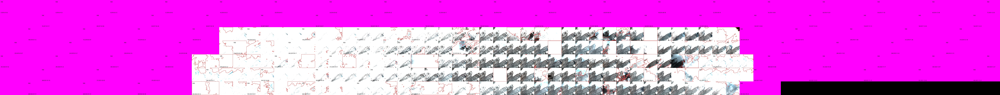

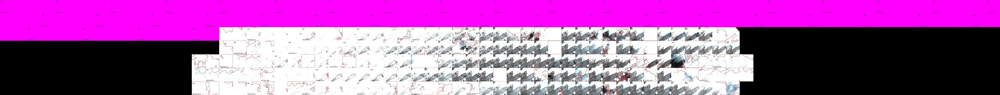

In [ ]:
plot_image(dx, ['B8A','B06','B05'], mask_name='cloudmask_en', stack_every=73, save_name='./out/RGB_original_dx.jpg')
plot_image(dx_new, ['B8A','B06','B05'], mask_name='cloudmask_en', stack_every=73, save_name='./out/RGB_compressed_dx.jpg')